In [78]:
from skimage.io import imread
import numpy as np
import matplotlib.pyplot as plt
import scipy
import skimage

# Q1 - Developing RAW images

## Q1.1 - Implement a basic image processing pipeline

### Q1.1.1 - RAW image conversion

In [ ]:
!dcraw -4 -d -v -w -T ./data/campus.NEF

Upon running we got the following output:

Loading Nikon Z 6_2 image from RAW_image_path...
Scaling with darkness 252, saturation 4095, and
multipliers 1.667969 1.000000 1.445313 1.000000 Building histograms...
Writing data to C:\Users\zacharyl\Desktop\Computational Imaging A1\campus.tiff ...

In [161]:
black = 252
white = 4095

r_scale = 1.667969
g_scale = 1.0
b_scale = 1.445313

Then we deleted the .tiff file, and ran the following command

In [ ]:
!rm ./data/campus.tiff
!dcraw -4 -D -T ./data/campus.NEF

### Q1.1.2 - Python initials

In [162]:
im_path = './data/campus.tiff'

raw_img = imread(im_path, plugin="matplotlib")
print(np.shape(raw_img))
img = raw_img.astype(np.float64)

(4040, 6064)


In [163]:
img.dtype

dtype('float64')

We note the following information regarding the image:

- Unsigned short Platform-defined integer type with 16 bits without sign, per pixel
- width 4040px
- height 6064px

### Q1.1.3 - Linearization

**Assumptions:**

- All pixels with a value lower than `black` correspond to pixels that would be black, were it not for noise.
- All pixels with a value above `white` are saturated.
- The values `black` for the black level and `white` for saturation are those you recorded earlier from the reconnaissance run of `dcraw`.

We then converted the image into a linear array within the range [0, 1],
and clipped negative values to 0, and values greater than 1 to 1, using the following code:

In [165]:
# darkness 252, saturation 4095
lin_img = np.clip((img - black) / (white - black), a_min = 0, a_max = 1)

### Q1.1.4 - Identifying the correct Bayer pattern

We claim that the correct Bayer colour pattern is 'rggb'.
To prove this, we will reveal the identities of three of the pixels in the top left of our image file.

We begin by taking advantage of the fact that for our given image file,
we already know which locations in the image correspond to red and green images.
To identify which pixels in the top-left 2x2 grid of the image corresponds to green in the original image,
we subset the image into four grids.
<br>

|-----|-----|-----|-----|
| im1 | im2 | im1 | im2 |
| im3 | im4 | im3 | im4 |
| im1 | im2 | im1 | im2 |
| im3 | im4 | im3 | im4 |


#### Splitting the image according to the grid

In [207]:
raw_manual_white_patch = img[2290:2300, 1085:1150]

raw_norm_img = (lin_img*1.0 / raw_manual_white_patch.max(axis=(0,1))).clip(0,1)

im1 = raw_norm_img[0::2, 0::2]
im2 = raw_norm_img[0::2, 1::2]
im3 = raw_norm_img[1::2, 0::2]
im4 = raw_norm_img[1::2, 1::2]

We then visualized each image, and visually inspected which image was the brightest in regions we knew were green and red(the green grass and the red leaves of the original image).
From this, we confirmed that im2 and im3 were green as they were highest in regions corresponding to the grass,
and that im1 was red, as it was most saturated in regions we knew were red leaves.
Thus, the correct Bayer pattern is 'rggb.'

#### Visualizing each image

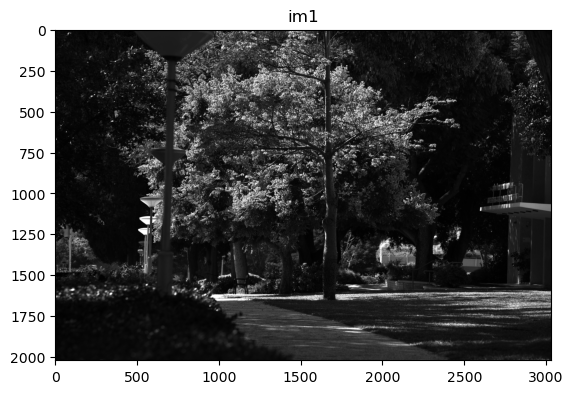

In [208]:
plt.imshow(np.clip(im1*5, 0, 1), cmap='gray')
plt.title('im1')
plt.show()

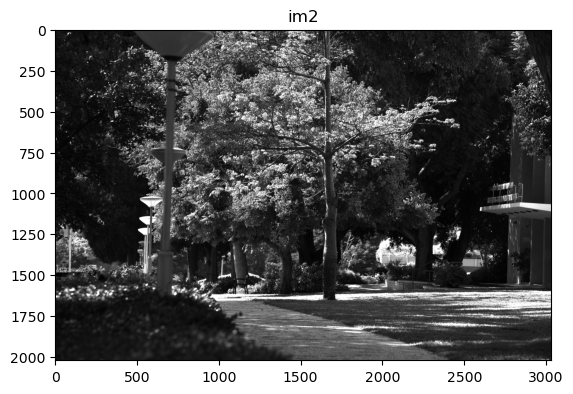

In [209]:
plt.imshow(np.clip(im2*5, 0, 1), cmap='gray')
plt.title('im2')
plt.show()

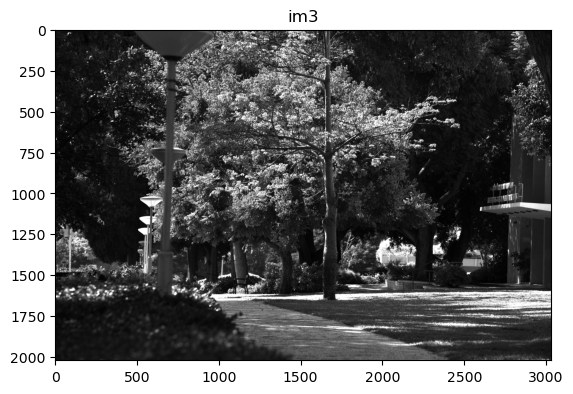

In [210]:
plt.imshow(np.clip(im3*5, 0, 1), cmap='gray')
plt.title('im3')
plt.show()

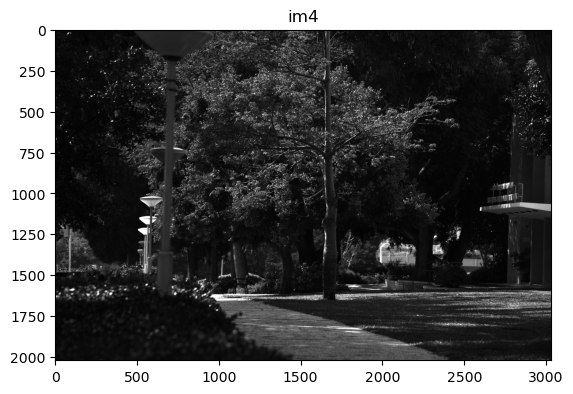

In [211]:
plt.imshow(np.clip(im4*5, 0, 1), cmap='gray')
plt.title('im4')
plt.show()

#### Inspecting individual coloured pixels

Inspecting a green pixel(green grass):

In [212]:
# green pixel - grass
im1[2000:2001, 3000:3001], im2[2000:2001, 3000:3001], im3[2000:2001, 3000:3001], im4[2000:2001, 3000:3001]

(array([[0.01405152]]),
 array([[0.02784283]]),
 array([[0.02784283]]),
 array([[0.01717408]]))

Inspecting a red pixel(red tree leaf):

In [213]:
# red pixel - tree leaf
im1[264:265, 1720:1721], im2[264:265, 1720:1721], im3[264:265, 1720:1721], im4[264:265, 1720:1721]

(array([[0.19854281]]),
 array([[0.14702056]]),
 array([[0.1478012]]),
 array([[0.08300807]]))

### Q1.1.5 - White balancing

In [214]:
def colour_balance(image, mode = "gray"):
    r = image[0::2, 0::2]
    g1 = image[0::2, 1::2]
    g2 = image[1::2, 0::2]
    b = image[1::2, 1::2]
    if mode == "gray":
        g_avg, r_avg, b_avg = g1.mean(), r.mean(), b.mean()
        r = (g_avg/r_avg)*r
        b = (g_avg/b_avg)*b
        return r, g1, b
    elif mode == "white":
        g_avg, r_avg, b_avg = g1.max(), r.max(), b.max()
        r = (g_avg / r_avg) * r
        b = (g_avg / b_avg) * b
        return r, g1, b
    elif mode == "custom":
        g_avg, r_avg, b_avg = 1.000000, 1.66796, 1.445313
        r = g_avg * r
        b = g_avg * b
        return r, g1, b

#### Testing colour balancing modes

Its a bit of a look-ahead, but we used the demosaicing process to test the colour-balanced images modes.
Hence the `demosaic_image` function will be defined in this question.

In [215]:
def demosaic_image(red, green, blue):
    im_stacked = np.dstack([red, green, blue])
    # we interpolate between grid points of the original image, not outside of it
    orig_x, orig_y = np.meshgrid(np.linspace(0, 1, im_stacked.shape[0]), np.linspace(0, 1, im_stacked.shape[1]), sparse = True)
    new_x, new_y = np.meshgrid(np.linspace(0, 1, lin_img.shape[0]), np.linspace(0, 1, lin_img.shape[1]), sparse = True)
    # colour channels are encoded as the third channel in the image in the order (r,g,b)
    img_stacked = np.dstack([scipy.interpolate.RectBivariateSpline(orig_x, orig_y, z = im_stacked.transpose(0,1,2)[:, :, i], kx = 1, ky = 1)(new_x, new_y) for i in range(3)])

    return img_stacked

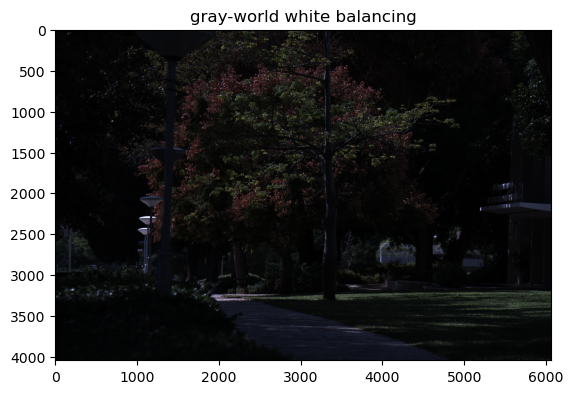

In [216]:
r,g,b = colour_balance(lin_img, "gray")
gray_im_stacked = demosaic_image(r, g, b)

plt.imshow(np.clip(gray_im_stacked, 0, 1))
plt.title('gray-world white balancing')
plt.show()

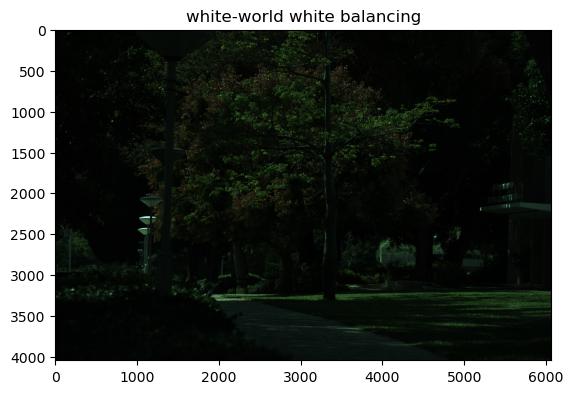

In [217]:
r,g,b = colour_balance(lin_img, "white")
white_im_stacked = demosaic_image(r, g, b)

plt.imshow(np.clip(white_im_stacked, 0, 1))
plt.title('white-world white balancing')
plt.show()

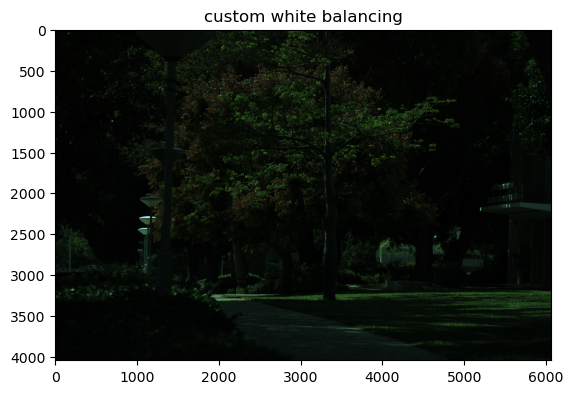

In [218]:
r,g,b = colour_balance(lin_img, "custom")
custom_im_stacked = demosaic_image(r, g, b)

plt.imshow(np.clip(custom_im_stacked, 0, 1))
plt.title('custom white balancing')
plt.show()

#### Choosing out preferred mode

We decided that we like the gray one the most.

In [219]:
r,g,b = colour_balance(lin_img, "gray")

### Q1.1.6 - Demosaicing

Note that the `demosaic_image` function was defined in the previous question, for the purpose of testing the white balancing.

In [220]:
img_stacked = demosaic_image(r, g, b)

### Q1.1.7 - Brightness adjustment and gamma encoding

In [221]:
def percentile_stretch(image, percentile):
    flatten_image = image.flatten()

    percentiles = [np.percentile(flatten_image, 3), np.percentile(flatten_image, percentile)]
    normalized_image = (image - percentiles[0])/(percentiles[1] - percentiles[0])
    return normalized_image

In [222]:
def gamma_encoding(image, gamma=1/2.2, black_value=255):
    gamma_encoded_image = (black_value*np.clip(image, 0, a_max = None)**gamma)

    return gamma_encoded_image

#### Checking stretched pixel hists

We started with checking the hist of pixel values before and after stretching them

In [223]:
# stretching colours histogram
im_norm = percentile_stretch(img_stacked, 99)

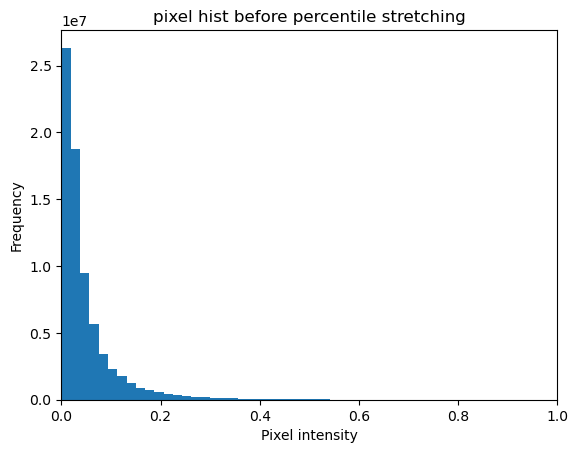

In [224]:
im_flat = img_stacked.flatten()

plt.hist(im_flat, bins=100)
plt.xlim(0, 1)
plt.title('pixel hist before percentile stretching')
plt.xlabel('Pixel intensity')
plt.ylabel('Frequency')
plt.show()

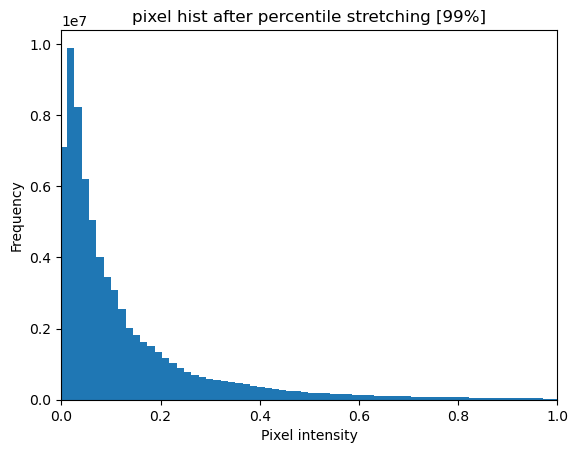

In [225]:
im_norm_flat = im_norm.flatten()

plt.hist(im_norm_flat, bins=400)
plt.title('pixel hist after percentile stretching [99%]')
plt.xlim(0, 1)
plt.xlabel('Pixel intensity')
plt.ylabel('Frequency')
plt.show()

#### Comparing multiple stretching percentiles outputs

Upon observing the stretching does what we expect it to do, we continued to compare the percentiles by the given image outputs.

In [296]:
# stretching colours histogram
im_norm_99_2_prc = percentile_stretch(img_stacked, 99.99)
im_norm_99_1_prc = percentile_stretch(img_stacked, 99.9)
im_norm_99 = percentile_stretch(img_stacked, 99)
im_norm_95 = percentile_stretch(img_stacked, 95)

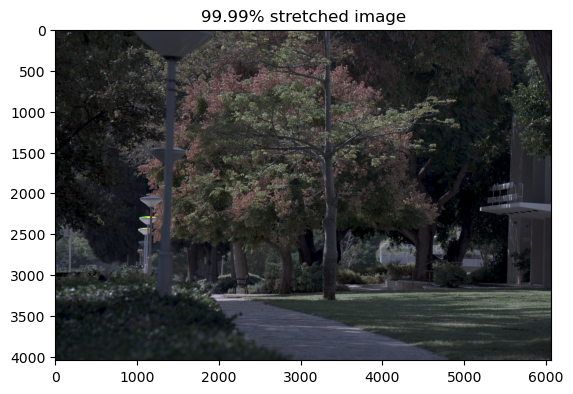

In [337]:
gamma_encoded_image_99_2_prc_float = gamma_encoding(im_norm_99_2_prc)
gamma_encoded_image_99_2_prc = gamma_encoded_image_99_2_prc_float.astype(np.uint8)
plt.imshow(gamma_encoded_image_99_2_prc)
plt.title('99.99% stretched image')
plt.show()

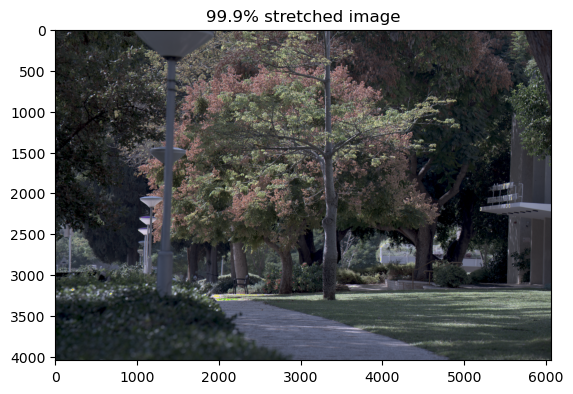

In [338]:
gamma_encoded_image_99_1_prc_float = gamma_encoding(im_norm_99_1_prc)
gamma_encoded_image_99_1_prc = gamma_encoded_image_99_1_prc_float.astype(np.uint8)
plt.imshow(gamma_encoded_image_99_1_prc)
plt.title('99.9% stretched image')
plt.show()

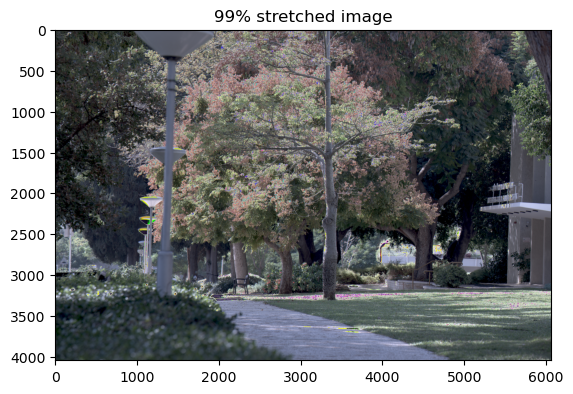

In [339]:
gamma_encoded_image_99_float = gamma_encoding(im_norm_99)
gamma_encoded_image_99 = gamma_encoded_image_99_float.astype(np.uint8)
plt.imshow(gamma_encoded_image_99)
plt.title('99% stretched image')
plt.show()

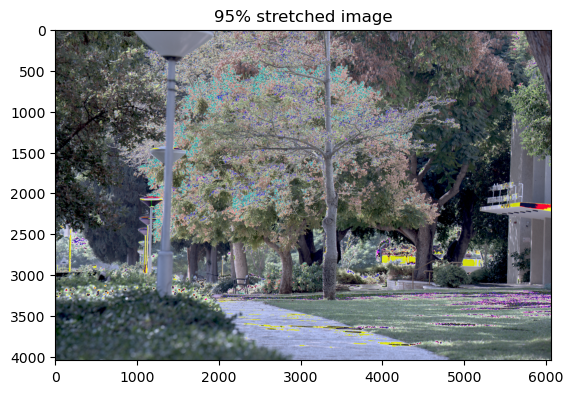

In [340]:
gamma_encoded_image_95_float = gamma_encoding(im_norm_95)
gamma_encoded_image_95 = gamma_encoded_image_95_float.astype(np.uint8)
plt.imshow(gamma_encoded_image_95)
plt.title('95% stretched image')
plt.show()

We chose to keep going with the 99.9999999%-stretched image

In [306]:
[np.percentile(img_stacked, 3), np.percentile(img_stacked, 99.9)]

[0.00631432441425744, 0.6433170517811182]

#### Camera controls equivalent

Adjusting the ISO and the exposure can result in the exact same effect as the histogram stretching.

### Q1.1.8 - Compression

#### Pre-saved image

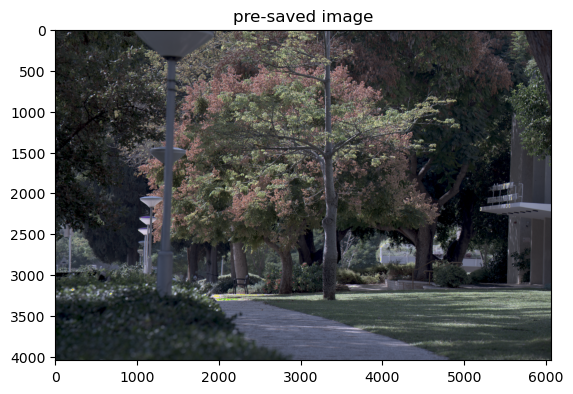

In [281]:
plt.imshow(gamma_encoded_image_99_1_prc)
plt.title('pre-saved image')
plt.show()

#### .png saved image

In [282]:
skimage.io.imsave('saved_image.png', gamma_encoded_image_99_1_prc)

In [283]:
png_img = skimage.io.imread('saved_image.png')

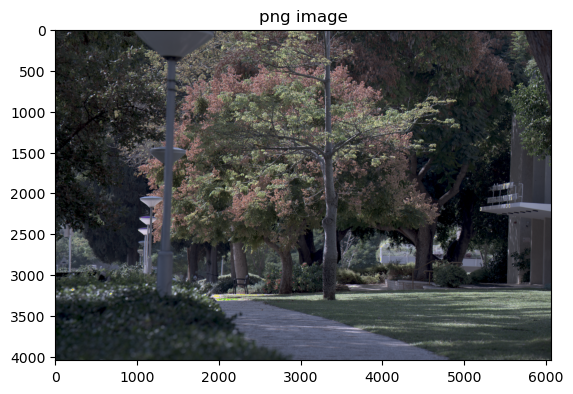

In [284]:
plt.imshow(png_img)
plt.title('png image')
plt.show()

#### .jpg saved image

In [285]:
skimage.io.imsave('saved_image.jpg', gamma_encoded_image_99_1_prc, quality=95)

In [286]:
jpg_img = skimage.io.imread('saved_image.jpg')

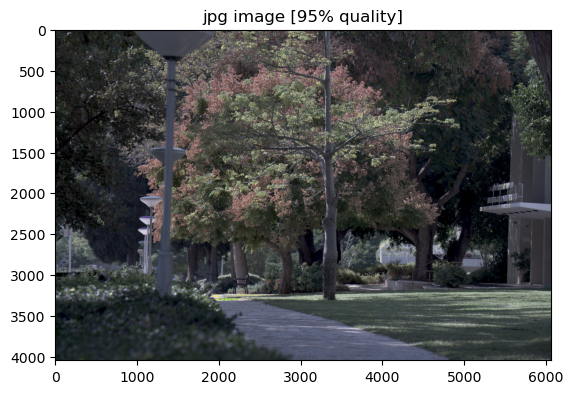

In [287]:
plt.imshow(jpg_img)
plt.title('jpg image [95% quality]')
plt.show()

#### .png and .jpg comparison

We were not able to distinguish the two images

In [288]:
!ls -lh saved_image.png

-rw-r--r--. 1 yehduap cdrom 31M Dec  3 19:59 saved_image.png


In [289]:
!ls -lh saved_image.jpg

-rw-r--r--. 1 yehduap cdrom 6.8M Dec  3 19:59 saved_image.jpg


In [290]:
compression_ratio = 34 / 8.5
print(f'The compression ratio is {compression_ratio}')

The compression ratio is 4.0


#### min JPEG quality

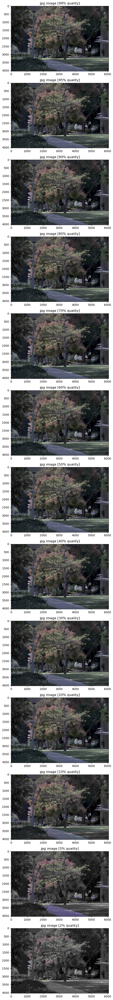

In [292]:
qualities = [99, 95, 90, 80, 70, 60, 50, 40, 30, 20, 10, 5, 2]
fig, ax = plt.subplots(nrows=len(qualities), ncols=1, figsize=(15, 50))

for i, quality in enumerate(qualities):
    skimage.io.imsave(f'saved_image_{quality}.jpg', gamma_encoded_image_99_1_prc, quality=quality)
    jpg_img = skimage.io.imread(f'saved_image_{quality}.jpg')
    ax[i].imshow(jpg_img)
    ax[i].set_title(f'jpg image [{quality}% quality]')

fig.tight_layout()

plt.show()

In our opinion 70% is slightly distinguishable from the uncompressed png image.
(The left cypress tree and right building colours seems a bit off)

In [298]:
!ls -lh saved_image.png

-rw-r--r--. 1 yehduap cdrom 31M Dec  3 19:59 saved_image.png


In [299]:
!ls -lh saved_image_70.jpg

-rw-r--r--. 1 yehduap cdrom 2.4M Dec  3 20:00 saved_image_70.jpg


In [300]:
compression_ratio = 34 / 2.4
print(f'The compression ratio is {compression_ratio}')

The compression ratio is 14.166666666666668


### Q1.2 - Boost image color saturation

In [349]:
normalized_image = im_norm_99_1_prc
gamma_encoded_image = gamma_encoded_image_99_1_prc

#### Unboosted image

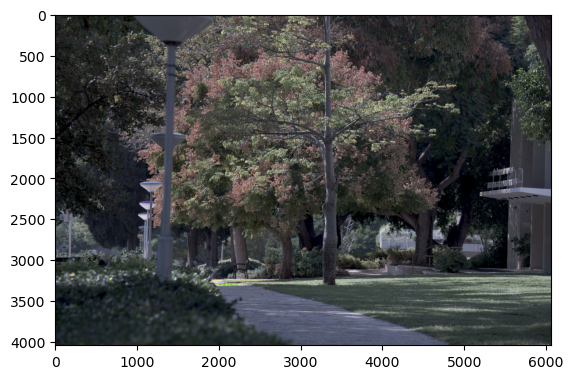

In [302]:
plt.imshow(gamma_encoded_image)
plt.show()

In [322]:
skimage.io.imsave('outputs/pre_saturation_boost.png', gamma_encoded_image)

#### Boosted image

In [320]:
def boost_colours(image, boost_level):
    boosted = skimage.color.rgb2hsv(image)
    boosted[:, :, 1] *= boost_level
    new = skimage.color.hsv2rgb(boosted)

    return new

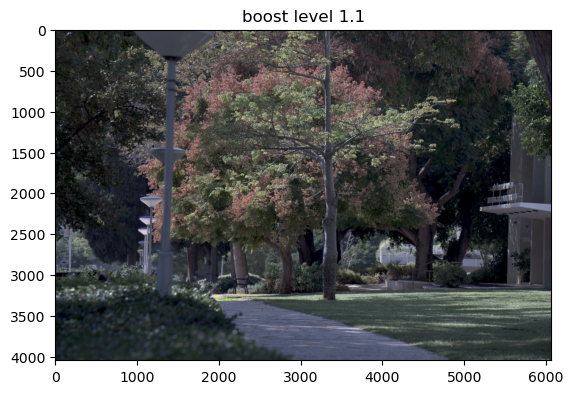

In [350]:
boost_level=1.1
boosted_img_1_1 = boost_colours(normalized_image, boost_level)
boosted_img_1_1 = gamma_encoding(boosted_img_1_1).astype(np.uint8)
plt.imshow(boosted_img_1_1)
plt.title(f'boost level {boost_level}')
plt.show()

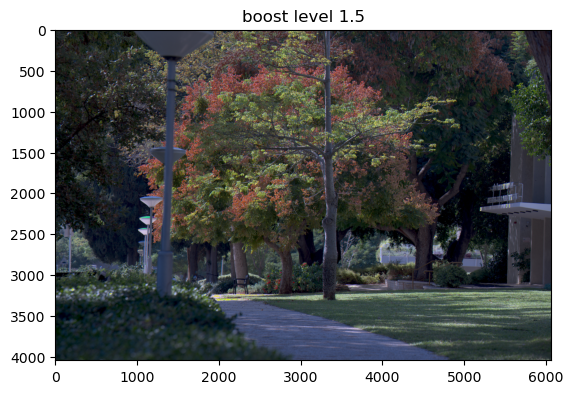

In [353]:
# boost the colours
boost_level=1.5
boosted_img_1_5 = boost_colours(normalized_image, boost_level)
boosted_img_1_5 = gamma_encoding(boosted_img_1_5).astype(np.uint8)
plt.imshow(boosted_img_1_5)
plt.title(f'boost level {boost_level}')
plt.show()

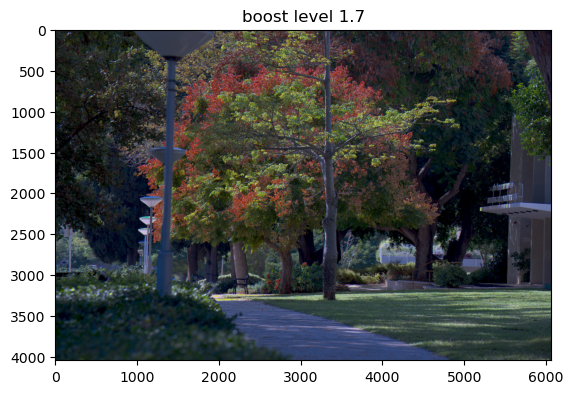

In [357]:
# boost the colours
boost_level=1.7
boosted_img_1_7 = boost_colours(normalized_image, boost_level)
boosted_img_1_7 = gamma_encoding(boosted_img_1_7).astype(np.uint8)
plt.imshow(boosted_img_1_7)
plt.title(f'boost level {boost_level}')
plt.show()

We like the second one best, as it look the most realistic to us.

In [356]:
skimage.io.imsave('outputs/post_saturation_boost.png', boosted_img_1_5)

#### saving two types of final processed white balancing images

In [359]:
skimage.io.imsave('outputs/gray_world.png', boosted_img_1_5)

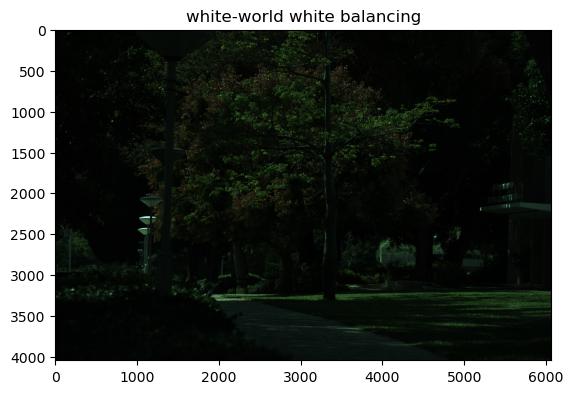

In [363]:
# perform white balancing
w_r, w_g, w_b = colour_balance(lin_img, "white")

# demosaic
white_img_stacked = demosaic_image(w_r, w_g, w_b)

plt.imshow(np.clip(white_im_stacked, 0, 1))
plt.title('white-world white balancing')
plt.show()

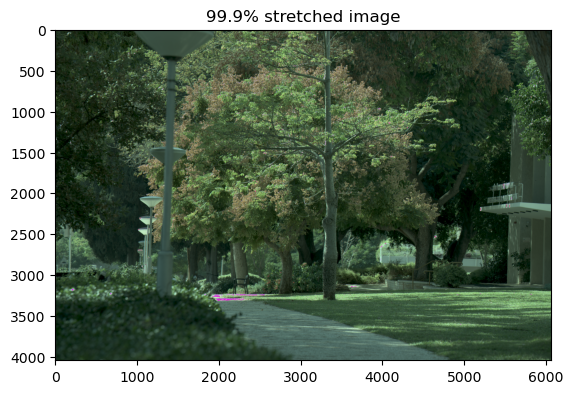

In [369]:
# normalize colours
stretch_param = 99.9
white_im_norm = percentile_stretch(white_img_stacked, stretch_param)

white_gamma_encoded_image_float = gamma_encoding(white_im_norm)
white_gamma_encoded_image = white_gamma_encoded_image_float.astype(np.uint8)
plt.imshow(white_gamma_encoded_image)
plt.title(f'{stretch_param}% stretched image')
plt.show()

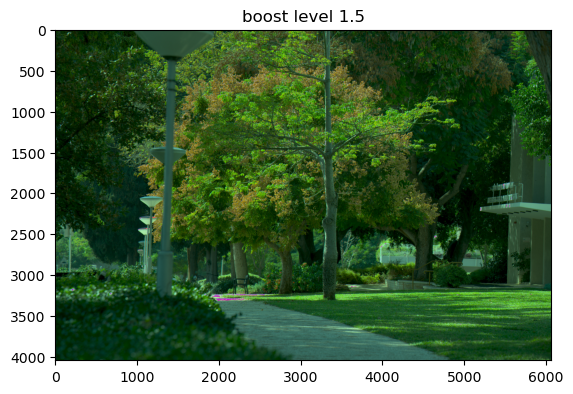

In [370]:
# boost the colours
white_normalized_image = white_im_norm
boost_level=1.5
white_boosted_img = boost_colours(white_normalized_image, boost_level)

# apply gamma encoding
white_boosted_img = gamma_encoding(white_boosted_img).astype(np.uint8)

plt.imshow(white_boosted_img)
plt.title(f'boost level {boost_level}')
plt.show()

In [371]:
skimage.io.imsave('outputs/white_world.png', white_boosted_img)

In [373]:
!jupyter nbconvert --execute --to pdf ex1.ipynb

[NbConvertApp] Converting notebook ex1.ipynb to html
Traceback (most recent call last):
  File "/usr/wisdom/python3/bin/jupyter-nbconvert", line 8, in <module>
    sys.exit(main())
  File "/usr/wisdom/python-3.7.4/lib/python3.7/site-packages/jupyter_core/application.py", line 254, in launch_instance
    return super(JupyterApp, cls).launch_instance(argv=argv, **kwargs)
  File "/usr/wisdom/python-3.7.4/lib/python3.7/site-packages/traitlets/config/application.py", line 845, in launch_instance
    app.start()
  File "/usr/wisdom/python-3.7.4/lib/python3.7/site-packages/nbconvert/nbconvertapp.py", line 350, in start
    self.convert_notebooks()
  File "/usr/wisdom/python-3.7.4/lib/python3.7/site-packages/nbconvert/nbconvertapp.py", line 524, in convert_notebooks
    self.convert_single_notebook(notebook_filename)
  File "/usr/wisdom/python-3.7.4/lib/python3.7/site-packages/nbconvert/nbconvertapp.py", line 489, in convert_single_notebook
    output, resources = self.export_single_notebook(n